# Libraries

In [1]:
#import libraries
import pandas as pd #read csv files
import numpy as np #numeric date(mean)
import seaborn as sns #visualization
from matplotlib import pyplot as plt #plot


# Earth Engine Libraries

In [2]:
#import earth engine
import ee
#create interactive map
import geemap
Map= geemap.Map()



# Get In-Situ Data FROM ALTM

In [3]:
import pandas as pd

# Read the Excel files
data_excel = pd.read_excel("C:\\Users\\Touhe\\ALL_LAKES_EQUATIONS_CDOM\\LTM_Data_2023_3_9 (2).xlsx", usecols=['DOC_MG_L', 'SITE_ID', 'DATE_SMP', 'SAMPLE_LOCATION'])
data_excel_site = pd.read_excel("C:\\Users\\Touhe\\ALL_LAKES_EQUATIONS_CDOM\\TIME_SERIES_SEASONAL_VARIABILITY\\Site_Information_2022_8_1 (2).xlsx", usecols=['SITE_ID', 'PROGRAM_ID', 'SITE_NAME','LAKE_DEPTH_MEAN'])

data_second_sheet_COORD = pd.read_excel("C:\\Users\\Touhe\\MACHINE_LEARNING\\MACHINE LEARNING 52 LAKES\\ALTM-50-stations.xlsx",
                                 sheet_name='updated station coordinates', usecols=['SITE_ID', 'LATDD', 'LONDD','LATDD_CENT','LONDD_CENT','SITE_NAME'])

# Merge the two DataFrames based on the common column 'SITE_ID'
merged_data_excel = pd.merge(data_excel, data_excel_site, on=['SITE_ID'])
merged_data_combined = pd.merge(merged_data_excel, data_second_sheet_COORD, on=['SITE_ID', 'SITE_NAME'])

data_modified = merged_data_combined.drop(columns=['SAMPLE_LOCATION'])
data_modified = data_modified[merged_data_combined['PROGRAM_ID'] == 'LTM_ALTM']


# Display the merged DataFrame
(data_modified)


,SITE_ID,DATE_SMP,DOC_MG_L,PROGRAM_ID,SITE_NAME,LAKE_DEPTH_MEAN,LATDD,LONDD,LATDD_CENT,LONDD_CENT
0,040850,1997-09-22,3.100000,LTM_ALTM,Squaw Lake,3.4,43.63645,-74.73844,43.63276,-74.73863
2,040850,1995-03-02,3.031000,LTM_ALTM,Squaw Lake,3.4,43.63645,-74.73844,43.63276,-74.73863
4,040850,1996-08-19,3.595000,LTM_ALTM,Squaw Lake,3.4,43.63645,-74.73844,43.63276,-74.73863
6,040850,2003-11-06,4.232000,LTM_ALTM,Squaw Lake,3.4,43.63645,-74.73844,43.63276,-74.73863
8,040850,2005-07-11,3.344000,LTM_ALTM,Squaw Lake,3.4,43.63645,-74.73844,43.63276,-74.73863
...,...,...,...,...,...,...,...,...,...,...
17863,1A3-048,2011-05-18,4.283944,LTM_ALTM,Grass Pond,1.5,43.69066,-75.06462,43.69207,-75.06172
17864,1A3-048,2015-06-10,5.509394,LTM_ALTM,Grass Pond,1.5,43.69066,-75.06462,43.69207,-75.06172
17865,1A3-048,2016-07-14,4.884900,LTM_ALTM,Grass Pond,1.5,43.69066,-75.06462,43.69207,-75.06172
17866,1A3-048,2016-09-15,6.344000,LTM_ALTM,Grass Pond,1.5,43.69066,-75.06462,43.69207,-75.06172


# POLYGON FUNCTION

In [4]:
# Function to create a five-sided polygon around the latitude and longitude
import ee
import geemap

# Function to create a five-sided polygon around the latitude and longitude
def create_lake_polygon(lat, lon):
    # Assuming each pixel is approximately 20 meters in size
    buffer_distance_meters = 3 * 20

    
    # Convert buffer distance from meters to degrees (approximate conversion)
    buffer_distance_degrees = buffer_distance_meters / 111320.0

    # Define the coordinates of the five vertices of the polygon
    coordinates = [
        [lon, lat + buffer_distance_degrees],
        [lon + buffer_distance_degrees, lat + buffer_distance_degrees / 2],
        [lon + buffer_distance_degrees / 2, lat - buffer_distance_degrees / 2],
        [lon - buffer_distance_degrees / 2, lat - buffer_distance_degrees / 2],
        [lon - buffer_distance_degrees, lat + buffer_distance_degrees / 2]
    ]

    # Create the polygon geometry
    polygon = ee.Geometry.Polygon(coordinates)

    return polygon

# Get Band Reflectance Values for 50 lakes with Dates and Lake Label

In [5]:
import ee
import geemap
import pandas as pd

# Authenticate and initialize the Earth Engine API
#ee.Authenticate()  # Only needed for the first time
ee.Initialize()

# Create a list of lake names
lake_names = [
    'Little Hope Pond', 'Big Hope Pond', 'East Copperas Pond', 'Sunday Pond', 'Sochia Pond',
    'Grass Pond (3)', 'Little Clear Pond', 'Loon Hollow Pond', 'Willys Lake', 'Woods Lake',
    'Middle Settlement Lake', 'Middle Branch Lake', 'Limekiln Lake', 'Squaw Lake', 'Indian Lake',
    'Brook Trout Lake', 'Lost Pond', 'North Lake', 'Willis Lake', 'Long Pond', 'Carry Pond',
    'Lake Colden', 'Avalanche Lake', 'Little Simon Pond', 'Raquette Lake Reservoir', 'G Lake',
    'Constable Pond', 'Middle Pond', 'Arbutus Pond', 'Sagamore Lake', 'Black Pond', 'Windfall Pond',
    'Queer Lake', 'Heart Lake', 'Big Moose Lake', 'Cascade Lake', 'Dart Lake', 'Little Echo Pond',
    'Moss Lake', 'Lake Rondaxe', 'Squash Pond', 'West Pond', 'Owen Pond', 'Jockeybush Lake',
    'Barnes Lake', 'Clear Pond', 'Otter Lake', 'Nate Pond', 'Grass Pond', 'South Lake (East Branch)'
]



# Define the Landsat 5 bands and their corresponding standard names
LC5_BANDS = ['SR_B1', 'SR_B2', 'SR_B3', 'SR_B4', 'SR_B5', 'SR_B7', 'ST_B6', 'QA_PIXEL']
STD_NAMES = ['blue', 'green', 'red', 'nir', 'swir1', 'swir2', 'temp', 'QA']


all_lakes = ee.FeatureCollection('projects/ee-mazard/assets/adk-samplelakes')

# Define the function to mask clouds and cloud shadows from Landsat 5 surface reflectance imagery
def maskL457sr(image):
    qaMask = image.select('QA_PIXEL').bitwiseAnd(int('11111', 2)).eq(0)
    saturationMask = image.select('QA_RADSAT').eq(0)
    qa = image.select('QA_PIXEL')
    opticalBands = image.select('SR_B.').multiply(0.0000275).add(-0.2)
    thermalBand = image.select('ST_B6').multiply(0.00341802).add(-124.15)
    return image.addBands(opticalBands, None, True).addBands(thermalBand, None, True).updateMask(qaMask).updateMask(saturationMask).clip(all_lakes)

# Define the function to compute the mean reflectance values for the specified bands within the region of interest (lake)
def reflectance(img, lake):
    reflectance_values = img.reduceRegion(reducer=ee.Reducer.mean(), geometry=lake_polygon, scale=30).select(STD_NAMES)
    return img.set('DATE_SMP', img.date().format()).set('reflectance', reflectance_values)

# Initialize an empty list to store the dataframes for each lake
dfs = []

# Create a dictionary to map each lake name to a numerical label
lake_name_to_label = {lake_name: i for i, lake_name in enumerate(lake_names)}

# Loop through each lake name and retrieve Landsat 5 imagery for that lake
for SITE_NAME in lake_names:
    # Retrieve Landsat 5 imagery for the specific lake
    lake = ee.FeatureCollection('projects/ee-touhedakhanom14/assets/stations-coord')\
        .filter(ee.Filter.eq('SITE_NAME', SITE_NAME))
    
    # Get the latitude and longitude of the station point
    lat = ee.Number(lake.geometry().coordinates().get(1)).getInfo()
    lon = ee.Number(lake.geometry().coordinates().get(0)).getInfo()

    # Create a polygon around the station point using the latitude and longitude
    lake_polygon = create_lake_polygon(lat, lon)


#     lake = ee.FeatureCollection('projects/ee-mazard/assets/adk-samplelakes') \
#     .filter(ee.Filter.eq('GNIS_Name', 'Big Moose Lake'))

    l5 = ee.ImageCollection('LANDSAT/LT05/C02/T1_L2') \
        .filter(ee.Filter.calendarRange(5, 12, 'month')) \
        .filter(ee.Filter.calendarRange(1985, 2011, 'year')) \
        .filterBounds(lake_polygon) \
        .filter(ee.Filter.lt('CLOUD_COVER', 15)) \
        .map(maskL457sr) \
        .select(LC5_BANDS, STD_NAMES)

    # Map the reflectance function over the Landsat 5 ImageCollection for the specific lake
    map_reflectance = l5.map(lambda img: reflectance(img, lake))

    # Add a new band 'lake_label' to each image with the lake label
#     l5 = l5.map(lambda img: img.addBands(ee.Image.constant(lake_name_to_label[SITE_NAME]).rename('lake_label')))
    
    # Reduce the mapped image collection to get reflectance values for the specific lake
    list_reflectance = map_reflectance.reduceColumns(ee.Reducer.toList(2), ['DATE_SMP', 'reflectance']).values().get(0)

    # Convert the results to a pandas DataFrame
    df_reflectance = pd.DataFrame(list_reflectance.getInfo(), columns=['DATE_SMP', 'reflectance'])
    df_reflectance['DATE_SMP'] = pd.to_datetime(df_reflectance['DATE_SMP'])
    df_reflectance['DATE_SMP'] = df_reflectance['DATE_SMP'].dt.date
    df_reflectance['reflectance'] = df_reflectance['reflectance'].apply(lambda x: {k: v for k, v in x.items() if v is not None})

    # Unpack the 'reflectance' dictionary and create separate columns for each band
    df_reflectance = pd.concat([df_reflectance.drop('reflectance', axis=1),
                                df_reflectance['reflectance'].apply(pd.Series).astype('float64', errors='ignore')], axis=1)

    # Add a new column for the lake name
    df_reflectance['SITE_NAME'] = SITE_NAME

    # Add a new column for the lake label (numeric representation)
    df_reflectance['LAKE_LABEL'] = lake_name_to_label[SITE_NAME]

    # Add the DataFrame to the list
    dfs.append(df_reflectance)

# Concatenate all DataFrames into a single DataFrame
df_all_lakes = pd.concat(dfs, ignore_index=True)

# Sort the DataFrame by 'DATE_SMP' in ascending order
df_all_lakes.sort_values(by='DATE_SMP', inplace=True)

# Display the DataFrame containing reflectance values for all lakes with separate columns for each lake
# print(df_all_lakes)




In [6]:
df_all_lakes

,DATE_SMP,QA,blue,green,nir,red,swir1,swir2,temp,SITE_NAME,LAKE_LABEL
4084,1985-07-13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Constable Pond,26
7890,1985-07-13,5440.086079,0.022400,0.026946,0.060513,0.016962,0.022367,0.008022,22.497771,Otter Lake,46
3579,1985-07-13,5440.000000,0.016107,0.029950,0.165203,0.019257,0.083053,0.034841,22.285085,Raquette Lake Reservoir,24
3674,1985-07-13,5440.000000,0.015971,0.028465,0.161260,0.017969,0.083207,0.034086,22.499166,Raquette Lake Reservoir,24
3832,1985-07-13,5451.124744,0.020138,0.025818,0.055543,0.019731,0.020593,0.012920,21.873623,G Lake,25
...,...,...,...,...,...,...,...,...,...,...,...
7468,2011-10-09,5469.058496,0.017592,0.026359,0.064651,0.025895,0.031842,0.016432,17.570502,Owen Pond,42
1418,2011-10-09,5492.639321,0.023432,0.023009,0.036134,0.021294,0.018605,0.011950,17.436511,Woods Lake,9
8099,2011-10-09,5456.765269,0.013586,0.023217,0.058178,0.021547,0.030708,0.014545,19.927833,Nate Pond,47
5118,2011-10-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Windfall Pond,31


In [7]:
df_all_lakes.dropna(inplace=True)

df_all_lakes

,DATE_SMP,QA,blue,green,nir,red,swir1,swir2,temp,SITE_NAME,LAKE_LABEL
7890,1985-07-13,5440.086079,0.022400,0.026946,0.060513,0.016962,0.022367,0.008022,22.497771,Otter Lake,46
3579,1985-07-13,5440.000000,0.016107,0.029950,0.165203,0.019257,0.083053,0.034841,22.285085,Raquette Lake Reservoir,24
3674,1985-07-13,5440.000000,0.015971,0.028465,0.161260,0.017969,0.083207,0.034086,22.499166,Raquette Lake Reservoir,24
3832,1985-07-13,5451.124744,0.020138,0.025818,0.055543,0.019731,0.020593,0.012920,21.873623,G Lake,25
4236,1985-07-13,5442.030345,0.026842,0.033989,0.059205,0.029690,0.030509,0.020874,22.296321,Middle Pond,27
...,...,...,...,...,...,...,...,...,...,...,...
3357,2011-10-09,5440.000000,0.018027,0.029082,0.116885,0.022996,0.055589,0.028556,18.497553,Avalanche Lake,22
7468,2011-10-09,5469.058496,0.017592,0.026359,0.064651,0.025895,0.031842,0.016432,17.570502,Owen Pond,42
1418,2011-10-09,5492.639321,0.023432,0.023009,0.036134,0.021294,0.018605,0.011950,17.436511,Woods Lake,9
8099,2011-10-09,5456.765269,0.013586,0.023217,0.058178,0.021547,0.030708,0.014545,19.927833,Nate Pond,47


# Geometry for Big Moose Lakes

In [8]:
entire_lake = ee.FeatureCollection('projects/ee-mazard/assets/adk-samplelakes') \
     .filter(ee.Filter.eq('GNIS_Name', 'Big Moose Lake'))

In [9]:
def lake_label_band(image):
     nir = image.select('SR_B4')
     lake_label = nir.multiply(0).add(34).rename('LAKE_LABEL')
    
     return image.addBands(lake_label, None, True)
    
LC5_BANDS = ['SR_B1', 'SR_B2', 'SR_B3', 'SR_B4', 'SR_B5', 'SR_B7', 'ST_B6', 'QA_PIXEL']
STD_NAMES = ['blue', 'green', 'red', 'nir', 'swir1', 'swir2', 'temp', 'QA']


new_bands= ['SR_B1','SR_B2','SR_B3','SR_B4','LAKE_LABEL','SR_B5']
STD_NEW= ['blue','green','red','nir','LAKE_LABEL','swir1']

l5_new = ee.ImageCollection('LANDSAT/LT05/C02/T1_L2') \
        .filter(ee.Filter.calendarRange(5, 12, 'month')) \
        .filter(ee.Filter.calendarRange(1985, 2011, 'year')) \
        .filterBounds(lake) \
        .filter(ee.Filter.lt('CLOUD_COVER', 15)) \
        .map(maskL457sr) \
        .map(lake_label_band)\
        .select(new_bands, STD_NEW)

In [10]:
# l5_new= l5.filterBounds(entire_lake)

# GET VALUES FOR THIS CODE

In [11]:
# import ee
# import pandas as pd

# # Authenticate and initialize the Earth Engine API
# ee.Initialize()

# # # ... (Previous code with function definitions and image collections)
# # l5_new = l5.map(lambda img: img.addBands(ee.Image.constant(lake_name_to_label["Big Moose Lake"]).rename('lake_label')))
# # l5_new= l5_new.filterBounds(entire_lake)


# entire_lake = ee.FeatureCollection('projects/ee-mazard/assets/adk-samplelakes') \
#      .filter(ee.Filter.eq('GNIS_Name', 'Big Moose Lake'))

# def get_band_values_as_df(image_collection, band_names, scale=30):
#     # Get the list of dates in the image collection
#     dates = image_collection.aggregate_array('DATE_ACQUIRED').map(lambda t: ee.Date(t).format('YYYY-MM-dd')).getInfo()

#     # Initialize an empty DataFrame
#     bands_df = pd.DataFrame()

#     # Loop through the dates and extract band values for each image
#     for date in dates:
#         # Get the image for the current date
#         image = image_collection.filterMetadata('DATE_ACQUIRED', 'equals', date).first()

#         # Select the specified bands from the image
#         sr_bands = image.select(band_names)

#         # Get the band values as a dictionary
#         bands_dict = sr_bands.reduceRegion(reducer=ee.Reducer.toList(), geometry=entire_lake, scale=scale).getInfo()
#         #use lat and long for the geometry 
        
#         # Convert the dictionary to a DataFrame and add the 'date' column
#         date_df = pd.DataFrame(bands_dict)
#         date_df['date'] = date

#         # Concatenate the DataFrame for the current date with the overall DataFrame
#         bands_df = pd.concat([bands_df, date_df], ignore_index=True)

#     return bands_df

# # Example usage
# # Define the band names you want to extract
# band_names = ['blue','green','red','LAKE_LABEL','nir']

# # Get the band values as a DataFrame
# bands_df = get_band_values_as_df(l5_new, band_names)

# # Print the DataFrame
# print(bands_df)


In [12]:
import ee
import pandas as pd

# Authenticate and initialize the Earth Engine API
ee.Initialize()

# # ... (Previous code with function definitions and image collections)
# l5_new = l5.map(lambda img: img.addBands(ee.Image.constant(lake_name_to_label["Big Moose Lake"]).rename('lake_label')))
# l5_new= l5_new.filterBounds(entire_lake)


entire_lake = ee.FeatureCollection('projects/ee-mazard/assets/adk-samplelakes') \
     .filter(ee.Filter.eq('GNIS_Name', 'Big Moose Lake'))

def get_band_values_as_df(image_collection, band_names, scale=30):
    # Get the list of dates in the image collection
    dates = image_collection.aggregate_array('DATE_ACQUIRED').map(lambda t: ee.Date(t).format('YYYY-MM-dd')).getInfo()

    # Initialize an empty DataFrame
    bands_df = pd.DataFrame()

    # Loop through the dates and extract band values for each image
    for date in dates:
        # Get the image for the current date
        image = image_collection.filterMetadata('DATE_ACQUIRED', 'equals', date).first()

        # Select the specified bands from the image
        sr_bands = image.select(band_names)

        # Get the band values as a dictionary
        bands_dict = sr_bands.reduceRegion(reducer=ee.Reducer.toList(), geometry=entire_lake, scale=scale).getInfo()
        #use lat and long for the geometry 
        
        # Convert the dictionary to a DataFrame and add the 'date' column
        date_df = pd.DataFrame(bands_dict)
        date_df['date'] = date

        # Concatenate the DataFrame for the current date with the overall DataFrame
        bands_df = pd.concat([bands_df, date_df], ignore_index=True)

    return bands_df

# Example usage
# Define the band names you want to extract
band_names = ['LAKE_LABEL', 'blue', 'green', 'nir', 'red']

# Get the band values as a DataFrame
bands_df = get_band_values_as_df(l5_new, band_names)

# Print the DataFrame
print(bands_df)


        LAKE_LABEL      blue     green       nir       red        date
0             34.0  0.021100  0.033530  0.097687  0.039717  1985-10-26
1             34.0  0.015380  0.021485  0.043485  0.018817  1985-10-26
2             34.0  0.018267  0.009440  0.037435  0.013565  1985-10-26
3             34.0  0.018267  0.015490  0.049535  0.024042  1985-10-26
4             34.0  0.018185  0.045520  0.145757  0.044942  1985-10-26
...            ...       ...       ...       ...       ...         ...
684909        34.0  0.019340  0.023520  0.036940  0.020577  2011-10-09
684910        34.0  0.024372  0.023520  0.032073  0.016453  2011-10-09
684911        34.0  0.021842  0.023520  0.095212  0.032952  2011-10-09
684912        34.0  0.021842  0.033832  0.075825  0.028828  2011-10-09
684913        34.0  0.034438  0.044090  0.100080  0.032952  2011-10-09

[684914 rows x 6 columns]


In [13]:
bands_df

,LAKE_LABEL,blue,green,nir,red,date
0,34.0,0.021100,0.033530,0.097687,0.039717,1985-10-26
1,34.0,0.015380,0.021485,0.043485,0.018817,1985-10-26
2,34.0,0.018267,0.009440,0.037435,0.013565,1985-10-26
3,34.0,0.018267,0.015490,0.049535,0.024042,1985-10-26
4,34.0,0.018185,0.045520,0.145757,0.044942,1985-10-26
...,...,...,...,...,...,...
684909,34.0,0.019340,0.023520,0.036940,0.020577,2011-10-09
684910,34.0,0.024372,0.023520,0.032073,0.016453,2011-10-09
684911,34.0,0.021842,0.023520,0.095212,0.032952,2011-10-09
684912,34.0,0.021842,0.033832,0.075825,0.028828,2011-10-09


In [14]:
entire_lake = ee.FeatureCollection('projects/ee-mazard/assets/adk-samplelakes') \
     .filter(ee.Filter.eq('GNIS_Name', 'Big Moose Lake'))

def get_band_values_as_df(image_collection, band_names, scale=30):
    # Get the list of dates in the image collection
    dates = image_collection.aggregate_array('DATE_ACQUIRED').map(lambda t: ee.Date(t).format('YYYY-MM-dd')).getInfo()

    # Initialize an empty DataFrame
    bands_df = pd.DataFrame()

    # Loop through the dates and extract band values for the entire lake region
    for date in dates:
        # Get the image for the current date
        image = image_collection.filterMetadata('DATE_ACQUIRED', 'equals', date).first()

        # Select the specified bands from the image
        sr_bands = image.select(band_names)

        # Get the band values as a dictionary for the entire lake region
        bands_dict = sr_bands.reduceRegion(reducer=ee.Reducer.mean(), geometry=entire_lake, scale=scale).getInfo()
        
        # Convert the dictionary to a DataFrame row and add the 'date' column
        date_df = pd.DataFrame({band: [bands_dict[band]] for band in band_names})
        date_df['date'] = date

        # Concatenate the DataFrame for the current date with the overall DataFrame
        bands_df = pd.concat([bands_df, date_df], ignore_index=True)

    return bands_df

# Example usage
# Define the band names you want to extract
band_names = ['LAKE_LABEL', 'blue', 'green', 'nir', 'red']

# Get the band values as a DataFrame
bands_df_average = get_band_values_as_df(l5_new, band_names)

# Print the DataFrame
print(bands_df_average)


    LAKE_LABEL      blue     green       nir       red        date
0           34  0.013728  0.014132  0.015500  0.010653  1985-10-26
1           34  0.013745  0.017715  0.037660  0.010838  1986-08-26
2           34  0.016185  0.021346  0.042731  0.013373  1987-06-10
3         None       NaN       NaN       NaN       NaN  1987-07-28
4           34  0.019696  0.032123  0.151546  0.023802  1987-08-13
..         ...       ...       ...       ...       ...         ...
152         34  0.025902  0.031560  0.055483  0.027347  2010-07-02
153         34  0.027324  0.034662  0.052461  0.030731  2011-06-03
154         34  0.025319  0.033031  0.069379  0.029218  2011-06-19
155         34  0.036352  0.040393  0.061043  0.033931  2011-07-05
156         34  0.020528  0.021907  0.027750  0.018039  2011-10-09

[157 rows x 6 columns]


In [15]:
# import ee
# import pandas as pd

# # Authenticate and initialize the Earth Engine API
# ee.Initialize()

# # List of lake names
# lake_names = [
#     'Little Hope Pond', 'Big Hope Pond', 'East Copperas Pond', 'Sunday Pond', 'Sochia Pond',
#     'Grass Pond (3)', 'Little Clear Pond', 'Loon Hollow Pond', 'Willys Lake', 'Woods Lake',
#     'Middle Settlement Lake', 'Middle Branch Lake', 'Limekiln Lake', 'Squaw Lake', 'Indian Lake',
#     'Brook Trout Lake', 'Lost Pond', 'North Lake', 'Willis Lake', 'Long Pond', 'Carry Pond',
#     'Lake Colden', 'Avalanche Lake', 'Little Simon Pond', 'Raquette Lake Reservoir', 'G Lake',
#     'Constable Pond', 'Middle Pond', 'Arbutus Pond', 'Sagamore Lake', 'Black Pond', 'Windfall Pond',
#     'Queer Lake', 'Heart Lake', 'Big Moose Lake', 'Cascade Lake', 'Dart Lake', 'Little Echo Pond',
#     'Moss Lake', 'Lake Rondaxe', 'Squash Pond', 'West Pond', 'Owen Pond', 'Jockeybush Lake',
#     'Barnes Lake', 'Clear Pond', 'Otter Lake', 'Nate Pond', 'Grass Pond', 'South Lake (East Branch)'
# ]

# # FeatureCollection for all lakes
# entire_lake = ee.FeatureCollection('projects/ee-mazard/assets/adk-samplelakes')

# def get_band_values_as_df(image_collection, band_names, scale=30):
#     # Initialize an empty list to store DataFrames for each lake
#     lake_dfs = []

#     # Loop through each lake
#     for SITE_NAME in lake_names:
#         # Filter Landsat imagery for the specific lake
#         lake = entire_lake.filter(ee.Filter.eq('GNIS_Name', SITE_NAME))

#         # Get the list of dates in the image collection for this lake
#         dates = image_collection.filterBounds(lake).aggregate_array('DATE_ACQUIRED')\
#             .map(lambda t: ee.Date(t).format('YYYY-MM-dd')).getInfo()

#         # Initialize an empty DataFrame for this lake
#         lake_df = pd.DataFrame()

#         # Loop through the dates and extract band values for each image
#         for date in dates:
#             # Get the image for the current date
#             image = image_collection.filterMetadata('DATE_ACQUIRED', 'equals', date).first()

#             # Select the specified bands from the image
#             sr_bands = image.select(band_names)

#             # Get the band values as a dictionary
#             bands_dict = sr_bands.reduceRegion(
#                 reducer=ee.Reducer.toList(), geometry=lake.geometry(), scale=scale).getInfo()

#             # Add 'date' column to the dictionary
#             bands_dict['date'] = date

#             # Convert the dictionary to a DataFrame
#             date_df = pd.DataFrame(bands_dict)

#             # Concatenate the DataFrame for the current date with the lake's DataFrame
#             lake_df = pd.concat([lake_df, date_df], ignore_index=True)

#         # Add 'SITE_NAME' column to the lake's DataFrame
#         lake_df['SITE_NAME'] = SITE_NAME

#         # Append the lake's DataFrame to the list
#         lake_dfs.append(lake_df)

#     # Concatenate DataFrames for all lakes into one DataFrame
#     return pd.concat(lake_dfs, ignore_index=True)

# # Example usage
# # Define the band names you want to extract
# band_names = ['blue', 'green', 'red', 'nir', 'swir1']

# # Get the band values as a DataFrame for all lakes
# bands_df = get_band_values_as_df(l5_new, band_names)

# # Print the DataFrame
# print(bands_df)


In [16]:
bands_df

,LAKE_LABEL,blue,green,nir,red,date
0,34.0,0.021100,0.033530,0.097687,0.039717,1985-10-26
1,34.0,0.015380,0.021485,0.043485,0.018817,1985-10-26
2,34.0,0.018267,0.009440,0.037435,0.013565,1985-10-26
3,34.0,0.018267,0.015490,0.049535,0.024042,1985-10-26
4,34.0,0.018185,0.045520,0.145757,0.044942,1985-10-26
...,...,...,...,...,...,...
684909,34.0,0.019340,0.023520,0.036940,0.020577,2011-10-09
684910,34.0,0.024372,0.023520,0.032073,0.016453,2011-10-09
684911,34.0,0.021842,0.023520,0.095212,0.032952,2011-10-09
684912,34.0,0.021842,0.033832,0.075825,0.028828,2011-10-09


In [17]:
#bands_df.to_excel(r'C:\Users\Touhe\Downloads\Bands Values with LADD AND LONDD for each station point.xlsx', index=False)


In [18]:
import pandas as pd

# Assuming 'bands_df' is your original DataFrame with 684914 rows

# Set the random seed for reproducibility
random_seed = 42

# Perform random sampling without replacement to get 9000 rows
sampled_df = bands_df.sample(n=9000, random_state=random_seed)

# Reset the index of the sampled DataFrame
sampled_df.reset_index(drop=True, inplace=True)

# Sort the sampled DataFrame by the 'date' column in ascending order
sampled_df = sampled_df.sort_values(by='date')

# Reset the index of the sorted DataFrame
sampled_df.reset_index(drop=True, inplace=True)



# Print the sampled DataFrame
print(sampled_df)



      LAKE_LABEL      blue     green       nir       red        date
0           34.0  0.022943  0.026847  0.034768  0.024207  1985-07-13
1           34.0  0.018185  0.023410  0.031137  0.014995  1985-07-13
2           34.0  0.016343  0.023300  0.031110  0.014912  1985-07-13
3           34.0  0.016590  0.016453  0.023905  0.011942  1985-07-13
4           34.0  0.018240  0.019973  0.027562  0.011942  1985-07-13
...          ...       ...       ...       ...       ...         ...
8995        34.0  0.021952  0.023602  0.017497  0.016480  2011-10-09
8996        34.0  0.019450  0.023602  0.022338  0.024730  2011-10-09
8997        34.0  0.019478  0.023602  0.027260  0.020605  2011-10-09
8998        34.0  0.021952  0.023602  0.017497  0.016480  2011-10-09
8999        34.0  0.016920  0.018460  0.017497  0.012355  2011-10-09

[9000 rows x 6 columns]


In [19]:
import pandas as pd
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler



df_all_lakes['DATE_SMP'] = pd.to_datetime(df_all_lakes['DATE_SMP'])
data_modified['DATE_SMP'] = pd.to_datetime(data_modified['DATE_SMP'])

data_modified.sort_values('DATE_SMP', inplace=True)
df_all_lakes.sort_values('DATE_SMP', inplace=True)



# Drop the 'nir' band column
# df_all_lakes.drop(columns='nir', inplace=True)

# Display the DataFrame containing reflectance values for all lakes with the new columns
# print(df_all_lakes)


merged_data_all = pd.merge_asof(data_modified, df_all_lakes, on='DATE_SMP', by='SITE_NAME', tolerance=pd.Timedelta(days=5))

# Drop rows where the 'Reflectance' column is null
merged_data_all = merged_data_all.dropna(subset=['blue'])

merged_data_all = merged_data_all.dropna(subset=['DOC_MG_L'])

merged_data_all = merged_data_all[merged_data_all['PROGRAM_ID'] == 'LTM_ALTM']
merged_data_all = merged_data_all.dropna(subset=['LAKE_DEPTH_MEAN'])


# Display the updated DataFrame
# print(merged_data)
merged_data_all


# Preprocessing the 'DATE_SMP' column to extract useful features
merged_data_all['DATE_SMP'] = pd.to_datetime(merged_data_all['DATE_SMP'])  # Convert to datetime if not already done
merged_data_all['year'] = merged_data_all['DATE_SMP'].dt.year
merged_data_all['month'] = merged_data_all['DATE_SMP'].dt.month
merged_data_all['day'] = merged_data_all['DATE_SMP'].dt.day
# merged_data_all['day_of_week'] = merged_data_all['DATE_SMP'].dt.dayofweek

# Drop the original 'DATE_SMP' column as it is no longer needed
merged_data_all = merged_data_all.drop(columns=['DATE_SMP'])


# Filter the data for only the Arbutus Pond' lake_label
#merged_data_all = merged_data_all[merged_data_all['SITE_NAME'] == 'Big Moose Lake']

# merged_data_all = merged_data_all[(merged_data_all['month'] == 9) | (merged_data_all['month'] == 10)]


# Preparing the training data for 'Arbutus Pond' lake_label
X = merged_data_all[['LAKE_LABEL', 'blue', 'green', 'nir', 'red']]  # Features
y = merged_data_all['DOC_MG_L']  # Target variable

# Group the data by 'LAKE_LABEL'
grouped_data = merged_data_all.groupby('LAKE_LABEL')

min_samples = 3  # Adjust this value based on your dataset and requirements

# Initialize lists to store the training and testing data for all lakes
X_train_all, X_test_all, y_train_all, y_test_all = [], [], [], []

# Loop through each lake group and split data into training and testing sets
for _, lake_group in grouped_data:
    X_lake = lake_group[['LAKE_LABEL', 'blue', 'green', 'nir', 'red']]
    y_lake = lake_group['DOC_MG_L']

    if len(lake_group) >= min_samples:
        # Split data into training and testing sets for the current lake
        X_train_lake, X_test_lake, y_train_lake, y_test_lake = train_test_split(X_lake, y_lake, test_size=0.3, random_state=42)

        # Append the data for the current lake to the corresponding lists
        X_train_all.append(X_train_lake)
        X_test_all.append(X_test_lake)
        y_train_all.append(y_train_lake)
        y_test_all.append(y_test_lake)

# Concatenate the training and testing data for all lakes
X_train = pd.concat(X_train_all)
X_test = pd.concat(X_test_all)
y_train = pd.concat(y_train_all)
y_test = pd.concat(y_test_all)

print('**************Data Points Used***************************')
num_rows, num_cols = X.shape
print("Number of rows:", num_rows)
print("Number of columns:", num_cols)

# Initialize models
models = {
    'RandomForest': RandomForestRegressor(random_state=42),
    'AdaBoost': AdaBoostRegressor(random_state=42),
    'XGBoost': XGBRegressor(random_state=42),
    'GradientBoosting': GradientBoostingRegressor(random_state=42),
    'LightGBM': LGBMRegressor(random_state=42),
    'SVR': SVR(),
    'MLPRegressor': MLPRegressor(random_state=42)
}

# Initialize lists to store model evaluation results
model_names, r2_scores, mses, rmses, maes = [], [], [], [], []

# Train and evaluate each model
for model_name, model in models.items():
    # Fit the model
    model.fit(X_train, y_train)

    # Predict DOC values for the testing data
    y_pred = model.predict(X_test)

    # Create DataFrames for the training and testing data with all bands and the predicted values
    data_train = X_train.copy()
    data_train['original_DOC'] = y_train
    data_train['predicted_DOC'] = model.predict(X_train)

    data_test = X_test.copy()
    data_test['original_DOC'] = y_test
    data_test['predicted_DOC'] = y_pred

    # Calculate evaluation metrics
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = mean_squared_error(y_test, y_pred, squared=False)
    mae = mean_absolute_error(y_test, y_pred)

    # Append the results to the lists
    model_names.append(model_name)
    r2_scores.append(r2)
    mses.append(mse)
    rmses.append(rmse)
    maes.append(mae)

    # Display the predicted DOC values for the training and testing data
    print(f'*************Predicted Training data ({model_name})***************')
    print(data_train)

    print(f'*************Predicted Testing data ({model_name})***************')
    print(data_test)

# Create a dataframe to store the results
evaluation_df_all = pd.DataFrame({
    'Model': model_names,
    'R^2': r2_scores,
    'MSE': mses,
    'RMSE': rmses,
    'MAE': maes
})

# Print the dataframe
print('# WITH LAKE LABEL AS FEATURES 5 day window/n')
print(evaluation_df_all)

**************Data Points Used***************************
Number of rows: 704
Number of columns: 5
*************Predicted Training data (RandomForest)***************
       LAKE_LABEL      blue     green       nir       red  original_DOC  \
2321          0.0  0.509829  0.569234  0.580885  0.578384     14.200000   
9108          0.0  0.018443  0.018338  0.025536  0.017298     10.885000   
9852          0.0  0.011331  0.013629  0.029494  0.008875     10.094000   
12124         0.0  0.022740  0.027605  0.047690  0.028257     12.287111   
1579          0.0  0.008406  0.009305  0.027408  0.007603     10.561000   
...           ...       ...       ...       ...       ...           ...   
5859         49.0  0.635870  0.688542  0.679344  0.695733      2.986000   
7947         49.0  0.033030  0.039999  0.052817  0.037470      3.032000   
10992        49.0  0.028343  0.035227  0.060697  0.028738      2.426000   
8683         49.0  0.013998  0.015002  0.028178  0.009879      2.389000   
4353     

In [20]:
# Drop rows with NaN values
bands_df_average.dropna(inplace=True)

# Reset the index after dropping rows
bands_df_average.reset_index(drop=True, inplace=True)

# Print the DataFrame
#print(bands_df_average)

In [21]:
# Extract only the first four bands from the DataFrame
X_TEST = bands_df.iloc[:, :5]

# Print the DataFrame
print(X_TEST)

        LAKE_LABEL      blue     green       nir       red
0             34.0  0.021100  0.033530  0.097687  0.039717
1             34.0  0.015380  0.021485  0.043485  0.018817
2             34.0  0.018267  0.009440  0.037435  0.013565
3             34.0  0.018267  0.015490  0.049535  0.024042
4             34.0  0.018185  0.045520  0.145757  0.044942
...            ...       ...       ...       ...       ...
684909        34.0  0.019340  0.023520  0.036940  0.020577
684910        34.0  0.024372  0.023520  0.032073  0.016453
684911        34.0  0.021842  0.023520  0.095212  0.032952
684912        34.0  0.021842  0.033832  0.075825  0.028828
684913        34.0  0.034438  0.044090  0.100080  0.032952

[684914 rows x 5 columns]


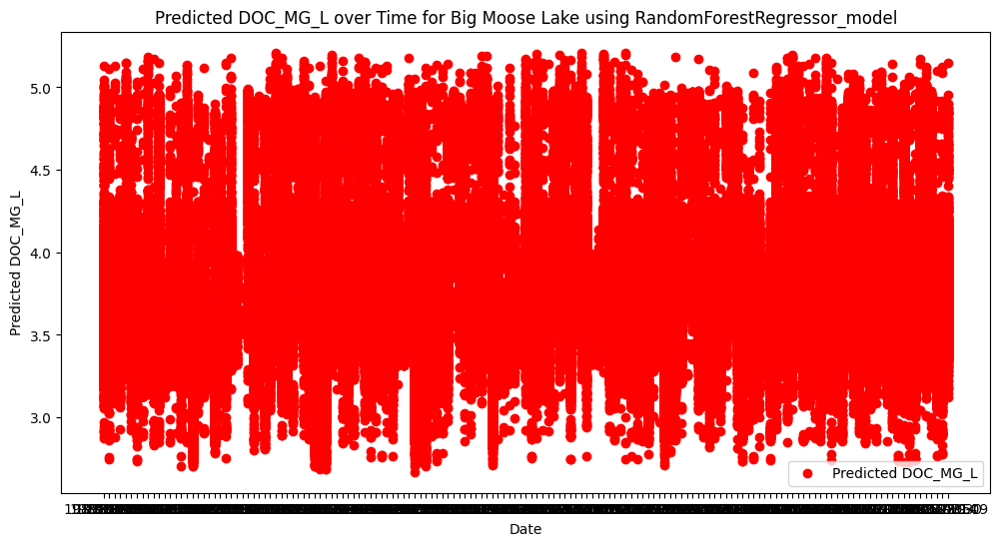

In [22]:
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor


# Initialize the GradientBoosting
RandomForestRegressor_model =  RandomForestRegressor(random_state=42)

RandomForestRegressor_model.fit(X_train, y_train)

# Use the trained model to predict the target variable for the new dataset
predicted_values_all_lakes = RandomForestRegressor_model.predict(X_TEST)



# Assuming 'DOC_MG_L' is the column where you want to store the predictions in 'df_all_lakes'
bands_df['predicted_DOC'] = predicted_values_all_lakes






import matplotlib.pyplot as plt

# Assuming you already have the 'DATE_SMP' column in 'df_all_lakes' (if not, you can add it back)

# Create a copy of the original DataFrame to avoid modifying the original data
df_plot = bands_df.copy()
# Add the predicted values to the DataFrame
df_plot['predicted_DOC'] = predicted_values_all_lakes

# Sort the DataFrame by 'DATE_SMP'
df_plot.sort_values(by='date', inplace=True)

# Filter only the data for 'Big Moose Lake'
#df_plot = df_plot[df_plot['LAKE_LABEL'] == 34]

# Plot the predicted 'DOC_MG_L' values over the 'DATE_SMP' column
plt.figure(figsize=(12, 6))
plt.scatter(df_plot['date'], df_plot['predicted_DOC'], label='Predicted DOC_MG_L', color='red')
plt.xlabel('Date')
plt.ylabel('Predicted DOC_MG_L')
# plt.ylim(0,6)
plt.title('Predicted DOC_MG_L over Time for Big Moose Lake using RandomForestRegressor_model')
plt.legend()
plt.show()


In [23]:
# import matplotlib.pyplot as plt
# import matplotlib.dates as mdates

# # Assuming you already have the 'DATE_SMP' column in 'df_all_lakes' (if not, you can add it back)

# # Filter only the data for 'Big Moose Lake'
# # df_plot = df_plot[df_plot['LAKE_LABEL'] == 34]

# # Plot the predicted 'DOC_MG_L' values over the 'DATE_SMP' column
# plt.figure(figsize=(12, 6))
# plt.scatter(df_plot['date'], df_plot['predicted_DOC'], label='Predicted DOC_MG_L', color='red')
# plt.xlabel('Date')
# plt.ylabel('Predicted DOC_MG_L')
# # plt.ylim(0, 6)
# plt.title('Predicted DOC_MG_L over Time for Big Moose Lake using AdaBoostRegressor_model')

# # Format the x-axis dates to display only the years
# plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# # Rotate the x-axis date labels for better visibility
# plt.gca().xaxis.set_major_locator(mdates.YearLocator())
# plt.xticks(rotation=45)

# plt.legend()
# plt.tight_layout()
# plt.show()


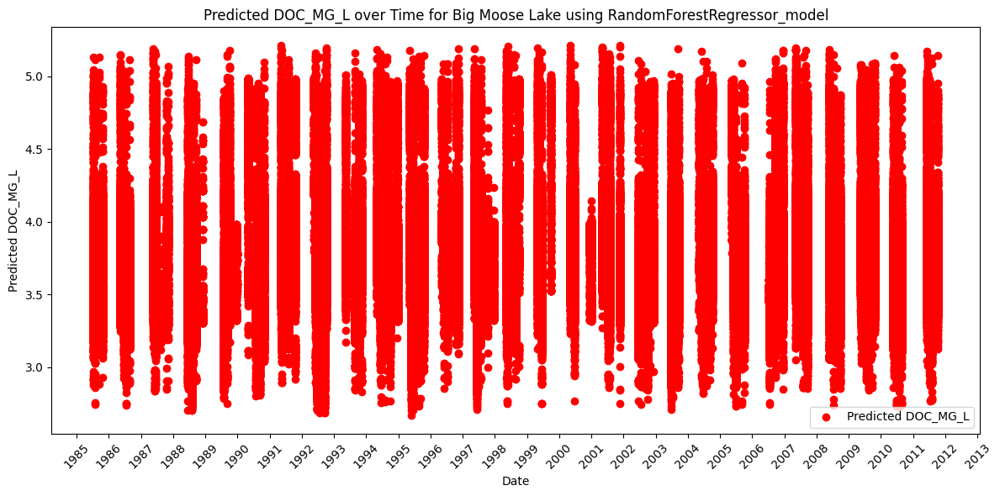

In [24]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Assuming you already have the 'DATE_SMP' column in 'df_all_lakes' (if not, you can add it back)

# Filter only the data for 'Big Moose Lake'
# df_plot = df_plot[df_plot['LAKE_LABEL'] == 34]

# Convert the 'date' column to pandas datetime object with the correct format
df_plot['date'] = pd.to_datetime(df_plot['date'], format='%Y-%m-%d')

# Plot the predicted 'DOC_MG_L' values over the 'date' column
plt.figure(figsize=(12, 6))
plt.scatter(df_plot['date'], df_plot['predicted_DOC'], label='Predicted DOC_MG_L', color='red')
plt.xlabel('Date')
plt.ylabel('Predicted DOC_MG_L')
# plt.ylim(0, 6)
plt.title('Predicted DOC_MG_L over Time for Big Moose Lake using RandomForestRegressor_model')

# Format the x-axis dates to display only the years
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# Rotate the x-axis date labels for better visibility
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.xticks(rotation=45)

plt.legend()
plt.tight_layout()
plt.show()


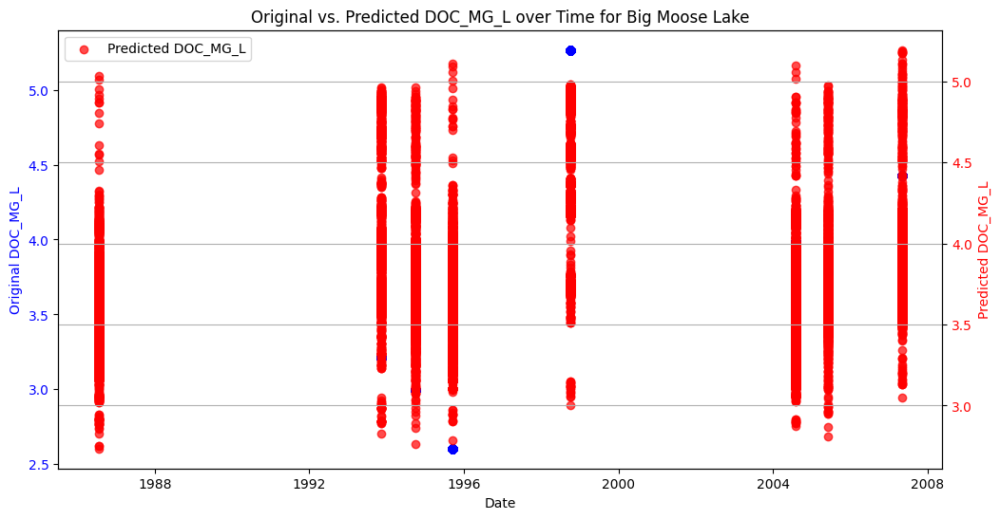

In [25]:
import matplotlib.pyplot as plt
import pandas as pd

# Rename the 'DATE_SMP' column to 'date' in data_modified DataFrame
data_modified.rename(columns={'DATE_SMP': 'date'}, inplace=True)

# Assuming you have a DataFrame 'original_df' that contains the original 'DOC_MG_L' values and 'date' column
# Merge the original 'DOC_MG_L' values with the 'df_plot' DataFrame based on the 'date' column
filtered_data = data_modified[data_modified['SITE_NAME'] == 'Big Moose Lake'][['date', 'DOC_MG_L']]

merged_df = df_plot.merge(filtered_data[['date', 'DOC_MG_L']], on='date', how='inner')

# Create subplots with twinx for overlaying original and predicted values on two y-axes
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot original 'DOC_MG_L' values (blue)
ax1.scatter(merged_df['date'], merged_df['DOC_MG_L'], label='Original DOC_MG_L', color='blue')
ax1.set_xlabel('Date')
ax1.set_ylabel('Original DOC_MG_L', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

ax2 = ax1.twinx()  # Create a second y-axis that shares the same x-axis

# Plot predicted 'DOC_MG_L' values (red)
ax2.scatter(merged_df['date'], merged_df['predicted_DOC'], label='Predicted DOC_MG_L', color='red', alpha=0.7)
ax2.set_ylabel('Predicted DOC_MG_L', color='red')
ax2.tick_params(axis='y', labelcolor='red')

# Add a title and legend
plt.title('Original vs. Predicted DOC_MG_L over Time for Big Moose Lake')
plt.legend(loc='upper left')

plt.grid(True)
plt.show()


In [26]:
# # Assuming df_plot has already been created as described in the previous code

# # Extract only the 'predicted_DOC' values for Big Moose Lake
# predicted_doc_values_big_moose_lake = df_plot[df_plot['LAKE_LABEL'] == 34]['predicted_DOC']

# # If you want to store the predicted 'DOC_MG_L' values in a separate variable, you can do the following:
# # predicted_doc_values = predicted_doc_values_big_moose_lake.values

# # Print or use the predicted 'DOC_MG_L' values as needed
# print(predicted_doc_values_big_moose_lake)


In [27]:
import pandas as pd

# Assuming df_plot has already been created as described in the previous code

# Extract only the 'predicted_DOC' values for Big Moose Lake
predicted_doc_values_big_moose_lake = merged_df[['date', 'predicted_DOC','DOC_MG_L']]

# Convert the 'date' column to pandas datetime object
predicted_doc_values_big_moose_lake['date'] = pd.to_datetime(predicted_doc_values_big_moose_lake['date'])

# Print the DataFrame with the predicted 'DOC_MG_L' values and corresponding dates
print(predicted_doc_values_big_moose_lake)


            date  predicted_DOC  DOC_MG_L
0     1986-07-16       3.489374     3.300
1     1986-07-16       3.560692     3.300
2     1986-07-16       3.381501     3.300
3     1986-07-16       3.381501     3.300
4     1986-07-16       3.560692     3.300
...          ...            ...       ...
39323 2007-05-07       4.597971     4.429
39324 2007-05-07       3.988710     4.429
39325 2007-05-07       3.893261     4.429
39326 2007-05-07       3.877808     4.429
39327 2007-05-07       4.065154     4.429

[39328 rows x 3 columns]


In [28]:
pd.set_option('display.max_rows', None)
predicted_doc_values_big_moose_lake

,date,predicted_DOC,DOC_MG_L
0,1986-07-16,3.489374,3.300
1,1986-07-16,3.560692,3.300
2,1986-07-16,3.381501,3.300
3,1986-07-16,3.381501,3.300
4,1986-07-16,3.560692,3.300
5,1986-07-16,3.596952,3.300
6,1986-07-16,3.492119,3.300
7,1986-07-16,3.672849,3.300
8,1986-07-16,3.387333,3.300
9,1986-07-16,3.270308,3.300


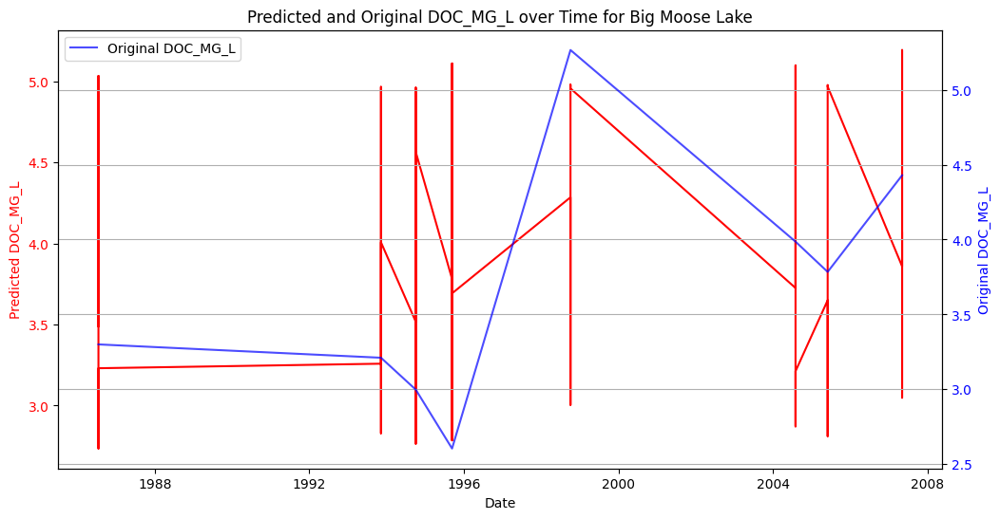

In [29]:
import matplotlib.pyplot as plt

# Create subplots with twinx for overlaying predicted_DOC and DOC_MG_L values on two y-axes
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot predicted_DOC values (red)
ax1.plot(predicted_doc_values_big_moose_lake['date'], predicted_doc_values_big_moose_lake['predicted_DOC'], label='Predicted DOC_MG_L', color='red')
ax1.set_xlabel('Date')
ax1.set_ylabel('Predicted DOC_MG_L', color='red')
ax1.tick_params(axis='y', labelcolor='red')

ax2 = ax1.twinx()  # Create a second y-axis that shares the same x-axis

# Plot DOC_MG_L values (blue)
ax2.plot(predicted_doc_values_big_moose_lake['date'], predicted_doc_values_big_moose_lake['DOC_MG_L'], label='Original DOC_MG_L', color='blue', alpha=0.7)
ax2.set_ylabel('Original DOC_MG_L', color='blue')
ax2.tick_params(axis='y', labelcolor='blue')

# Add a title and legend
plt.title('Predicted and Original DOC_MG_L over Time for Big Moose Lake')
plt.legend(loc='upper left')

plt.grid(True)
plt.show()


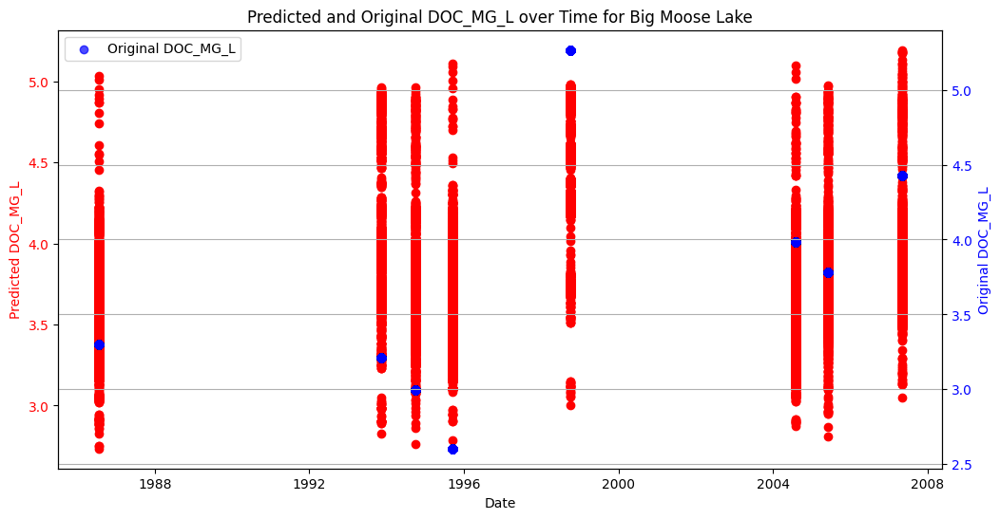

In [30]:
import matplotlib.pyplot as plt

# Create subplots with twinx for overlaying predicted_DOC and DOC_MG_L values on two y-axes
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot predicted_DOC values (red)
ax1.scatter(predicted_doc_values_big_moose_lake['date'], predicted_doc_values_big_moose_lake['predicted_DOC'], label='Predicted DOC_MG_L', color='red')
ax1.set_xlabel('Date')
ax1.set_ylabel('Predicted DOC_MG_L', color='red')
ax1.tick_params(axis='y', labelcolor='red')

ax2 = ax1.twinx()  # Create a second y-axis that shares the same x-axis

# Plot DOC_MG_L values (blue)
ax2.scatter(predicted_doc_values_big_moose_lake['date'], predicted_doc_values_big_moose_lake['DOC_MG_L'], label='Original DOC_MG_L', color='blue', alpha=0.7)
ax2.set_ylabel('Original DOC_MG_L', color='blue')
ax2.tick_params(axis='y', labelcolor='blue')

# Add a title and legend
plt.title('Predicted and Original DOC_MG_L over Time for Big Moose Lake')
plt.legend(loc='upper left')

plt.grid(True)
plt.show()


In [31]:
l5 = ee.ImageCollection('LANDSAT/LT05/C02/T1_L2') \
        .filter(ee.Filter.calendarRange(5, 12, 'month')) \
        .filter(ee.Filter.calendarRange(1985, 2011, 'year')) \
        .filterBounds(lake) \
        .filter(ee.Filter.lt('CLOUD_COVER', 15)) \
        .map(maskL457sr) \
        .select(LC5_BANDS, STD_NAMES)

In [32]:
#ee.Authenticate()
# Extract the first image
first_image = l5.first()
 
# Display band information about the image
first_image.bandNames().getInfo()

['blue', 'green', 'red', 'nir', 'swir1', 'swir2', 'temp', 'QA']

In [33]:
# first_image = collection.first()
 
# # Get number of years after 1991 from the first image
# year = ee.Date(first_image.get('system:time_start')).get('year').subtract(1991)
 
# # Turn it into a band
# img1 = ee.Image(year).byte().addBands(first_image)
 
# # A new band appears in the new image
# img1.bandNames().getInfo()

In [34]:
import ee

# Initialize Earth Engine
ee.Initialize()

# Load the entire lake geometry
entire_lake = ee.FeatureCollection('projects/ee-mazard/assets/adk-samplelakes') \
    .filter(ee.Filter.eq('GNIS_Name', 'Big Moose Lake'))

# Assuming you have latitude and longitude columns in the DataFrame
def create_point_feature(row):
    # Create a point geometry from latitude and longitude
    geometry= ee.FeatureCollection('projects/ee-mazard/assets/adk-samplelakes') \
    .filter(ee.Filter.eq('GNIS_Name', 'Big Moose Lake'))

    # Create a feature with geometry and properties
    feature = ee.Feature(geometry, {
        'date': row['date'].isoformat(),  # Convert date to ISO format
        'predicted_DOC': row['predicted_DOC']
    })
    
    return feature

# Convert the DataFrame to a list of features
features = predicted_doc_values_big_moose_lake.apply(create_point_feature, axis=1).tolist()

# Create a FeatureCollection from the list of features
fc = ee.FeatureCollection(features)

# Set the geometry of the FeatureCollection to the entire lake geometry
fc = fc.set('geometry', entire_lake.geometry())

# Print the FeatureCollection
#print(fc.getInfo())


In [35]:



import ee
import folium

# Initialize Earth Engine
ee.Initialize()

# Load your FeatureCollection
# Replace 'your_asset_id' with the actual asset ID of your FeatureCollection
fc = ee.FeatureCollection('projects/ee-mazard/assets/adk-samplelakes') \
    .filter(ee.Filter.eq('GNIS_Name', 'Big Moose Lake'))
# Define a function to style the features based on 'predicted_DOC' values
def style_function(feature):
    doc_value = ee.Number(feature.get('predicted_DOC'))
    return {
        'color': 'red' if doc_value.gt(10) else 'green',  # Use .gt() for greater than
        'fillOpacity': 0.5,
    }

# Apply the style function to the FeatureCollection
fc = fc.map(lambda feature: feature.set(style_function(feature)))

# Create a map centered on Big Moose Lake
map_center = [43.81881397847559, -74.88021691203394]
m = folium.Map(location=map_center, zoom_start=13)

# Convert the Earth Engine FeatureCollection to a GeoJSON
fc_geojson = fc.getInfo()

# Add GeoJSON to the map with the defined style function
folium.GeoJson(
    fc_geojson,
    style_function=lambda feature: {
        'fillColor': feature['properties']['color'],  # Set fill color based on style function
        'fillOpacity': feature['properties']['fillOpacity']
    }
).add_to(m)

# Display the map
m


In [36]:
import geemap
import ee

# Create a color palette for visualization
palette = ['000000', '0000FF', '00FF00', 'FFFF00', 'FF0000']

# Initialize Earth Engine
ee.Initialize()

# Load the FeatureCollection (fc) that you created earlier
# Assuming you have the 'fc' FeatureCollection as created in previous responses

# Define a function to add the FeatureCollection as a band to each image in the collection
def addFeatureCollectionAsBand(image):
    # Convert the FeatureCollection to an image
    fc_image = fc.reduceToImage(properties=['predicted_DOC'], reducer=ee.Reducer.first())

    # Add the FeatureCollection image as a new band to the input image
    image_with_band = image.addBands(fc_image)

    return image_with_band

# Load the Landsat 5 ImageCollection and apply the filtering operations
l5 = ee.ImageCollection('LANDSAT/LT05/C02/T1_L2') \
    .filter(ee.Filter.calendarRange(5, 12, 'month')) \
    .filter(ee.Filter.calendarRange(1985, 2011, 'year')) \
    .filterBounds(lake) \
    .filter(ee.Filter.lt('CLOUD_COVER', 15)) \
    .map(maskL457sr) \
    .select(LC5_BANDS, STD_NAMES)

# Map the function over the ImageCollection to add the FeatureCollection as a band
l5_with_band = l5.map(addFeatureCollectionAsBand)

# Get the first image from the collection
first_image = l5_with_band.first()

# Apply a color palette to the 'first' band
vis_params = {
    'min': 0,
    'max': 0.1,
    'palette': palette
}

# Create a Map object
doc_map = geemap.Map(center=[43.82520180, -74.86152861], zoom=10)

# Display the 'first' band with the color palette
doc_map.add_ee_layer(first_image.select('blue').visualize(**vis_params), {}, 'Predicted DOC Concentration')

# Display the map
doc_map


Map(center=[43.8252018, -74.86152861], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=…